# 90 Animal Images classification Data Mining and Machine learning

## Download dataset from Kaggle

### Install kaggle API to google colab

In [ ]:
!pip install kaggle

## Import API key from Kaggle
You need an API token to authenticate the download from Kaggle.

* Go to your Kaggle account settings.
* Scroll down to the API section and click on Create New API Token. This will download a file called kaggle.json to your computer.
* Upload this file to your Colab environment using:

In [ ]:
from google.colab import files
files.upload()

Or you can upload from your Google drive if you already uploaded your kaggle.json to Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## Move the Kaggle Token to the Right Location
* You need to place the kaggle.json file in a specific directory to use the Kaggle API:

In [ ]:
!mkdir -p ~/.kaggle
!cp /content/gdrive/MyDrive/Kaggle/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download the dataset

In [ ]:
!kaggle datasets download -d iamsouravbanerjee/animal-image-dataset-90-different-animals

Dataset URL: https://www.kaggle.com/datasets/iamsouravbanerjee/animal-image-dataset-90-different-animals
License(s): other
 99% 651M/656M [00:04<00:00, 182MB/s]
100% 656M/656M [00:04<00:00, 143MB/s]


## Unzip the zip file to datasets folder

In [ ]:
# importing required modules
from zipfile import ZipFile

In [ ]:
file_name = "animal-image-dataset-90-different-animals.zip"
# opening the zip file in READ mode
with ZipFile(file_name, 'r') as zip:
    # printing all the contents of the zip file
    zip.printdir()

    # extracting all the files
    print('Extracting all the files now...')
    zip.extractall()
    print('Done!')

Streaming output truncated to the last 5000 lines.
animals/animals/bison/75ab166a7d.jpg           2022-07-17 11:21:20        92128
animals/animals/bison/79e1610d01.jpg           2022-07-17 11:21:20       836920
animals/animals/bison/7ba5eee91f.jpg           2022-07-17 11:21:20        11618
animals/animals/bison/7d214aab4b.jpg           2022-07-17 11:21:20       221281
animals/animals/bison/7f2ef9ab03.jpg           2022-07-17 11:21:20        14082
animals/animals/bison/82ec723a4f.jpg           2022-07-17 11:21:20        17166
animals/animals/bison/85e145af6c.jpg           2022-07-17 11:21:20       390005
animals/animals/bison/862e2c6379.jpg           2022-07-17 11:21:20        13053
animals/animals/bison/87a5c700ad.jpg           2022-07-17 11:21:20       356918
animals/animals/bison/88b723ce90.jpg           2022-07-17 11:21:20        17685
animals/animals/bison/8c3af742c3.jpg           2022-07-17 11:21:20      2672107
animals/animals/bison/8e34044b98.jpg           2022-07-17 11:21:20   

In [ ]:
import os

PATH_DIR = "/content/animals/animals"
os.chdir(PATH_DIR)
for item in os.listdir():
  print(item)

sparrow
cow
woodpecker
hare
deer
crab
pigeon
starfish
oyster
cockroach
squirrel
bee
eagle
koala
elephant
boar
penguin
shark
hamster
chimpanzee
owl
ox
cat
sandpiper
lobster
butterfly
lion
possum
otter
okapi
hyena
goat
lizard
panda
pig
swan
squid
antelope
caterpillar
whale
fox
porcupine
beetle
turkey
reindeer
dog
rat
seal
wolf
zebra
goose
dragonfly
jellyfish
grasshopper
horse
octopus
crow
kangaroo
dolphin
mouse
bison
gorilla
seahorse
rhinoceros
duck
sheep
orangutan
hippopotamus
moth
goldfish
mosquito
wombat
hornbill
ladybugs
hedgehog
hummingbird
pelecaniformes
turtle
snake
tiger
badger
parrot
bat
leopard
fly
flamingo
bear
donkey
raccoon
coyote


# Import everything we may need later on

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as matplotlib
import tf_keras as tfk
import sklearn
import pandas as pd
import matplotlib
import numpy as np
import tensorflow as tf
from pathlib import Path
import os.path
import matplotlib.image as mpimg
import os
import cv2
import random
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

from sklearn.metrics import confusion_matrix, classification_report

# Please run this before start using the notebook

import datetime
print(f"Notebook last run (end-to-end): {datetime.datetime.now()}")

print(f"TensorFlow version: {tf.__version__}")

print(f"NumPy version: {np.__version__}")

print(f"Matplotlib version: {matplotlib.__version__}")

print(f"Pandas version: {pd.__version__}")

print(f"Scikit-Learn version: {sklearn.__version__}")

print(f"TensorFlow Keras version: {tfk.__version__}")
print(f"Matplotlib version: {matplotlib.__version__}")
print(f"Seaborn version: {sns.__version__}")



Notebook last run (end-to-end): 2024-10-27 13:40:46.075289
TensorFlow version: 2.17.0
NumPy version: 1.26.4
Matplotlib version: 3.7.1
Pandas version: 2.2.2
Scikit-Learn version: 1.5.2
TensorFlow Keras version: 2.17.0
Matplotlib version: 3.7.1
Seaborn version: 0.13.2


# Explore the data

* All class names in we need to classify

In [ ]:
# Open the file and read its content
with open('/content/name of the animals.txt', 'r') as file:
    content = file.read()

# # Print the content
# print(content)

class_names = content.split("\n")

print("Number of classes:", len(class_names))
print(class_names)

Number of classes: 90
['antelope', 'badger', 'bat', 'bear', 'bee', 'beetle', 'bison', 'boar', 'butterfly', 'cat', 'caterpillar', 'chimpanzee', 'cockroach', 'cow', 'coyote', 'crab', 'crow', 'deer', 'dog', 'dolphin', 'donkey', 'dragonfly', 'duck', 'eagle', 'elephant', 'flamingo', 'fly', 'fox', 'goat', 'goldfish', 'goose', 'gorilla', 'grasshopper', 'hamster', 'hare', 'hedgehog', 'hippopotamus', 'hornbill', 'horse', 'hummingbird', 'hyena', 'jellyfish', 'kangaroo', 'koala', 'ladybugs', 'leopard', 'lion', 'lizard', 'lobster', 'mosquito', 'moth', 'mouse', 'octopus', 'okapi', 'orangutan', 'otter', 'owl', 'ox', 'oyster', 'panda', 'parrot', 'pelecaniformes', 'penguin', 'pig', 'pigeon', 'porcupine', 'possum', 'raccoon', 'rat', 'reindeer', 'rhinoceros', 'sandpiper', 'seahorse', 'seal', 'shark', 'sheep', 'snake', 'sparrow', 'squid', 'squirrel', 'starfish', 'swan', 'tiger', 'turkey', 'turtle', 'whale', 'wolf', 'wombat', 'woodpecker', 'zebra']


### Display some images

In [ ]:
# View an image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import random
from PIL import Image


def view_random_image_resize(target_dir, target_class, height=224, width=224):
    # Setup target directory (we'll view images from here)
    target_folder = target_dir + target_class

    # Get a random image path
    random_image = random.sample(os.listdir(target_folder), 1)[0]

    # Load the image using PIL and resize it to 224x224
    img = Image.open(os.path.join(target_folder, random_image))
    img = img.resize((height, width))  # Resize to 224x224 pixels

    return img


def view_a_random_images_class_resize(target_dir, target_class, height=224, width=224):
    print(f"Image class: {target_class}")
    # Create the figure and set the overall title
    # Adjust figure size as needed
    fig, axs = plt.subplots(1, 4, figsize=(15, 5))
    # Set the title for the entire figure
    fig.suptitle(target_class, fontsize=16)

    target_folder = os.path.join(target_dir, target_class)
    random_images = random.sample(os.listdir(
        target_folder), 4)  # Select 4 random images

    # Loop through each subplot to display the images
    for i in range(4):
        img_path = os.path.join(target_folder, random_images[i])
        img = Image.open(img_path).resize((height, width))
        axs[i].imshow(img)
        axs[i].axis("off")  # Hide axes for each subplot

    plt.show()

Image shape: (224, 224)
raccoon


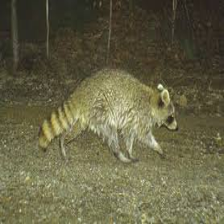

In [ ]:
import random

i = random.randrange(len(class_names))

img = view_random_image_resize("/content/animals/animals/", class_names[i])
print(f"Image shape: {img.size}")
print(class_names[i])
img

Image class: lobster


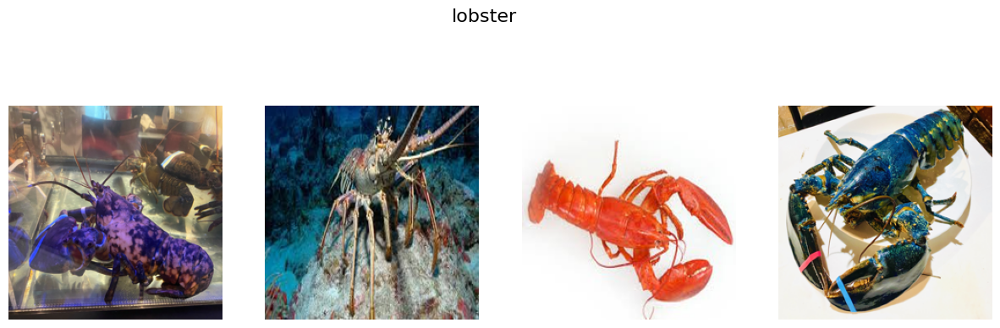

Image class: lizard


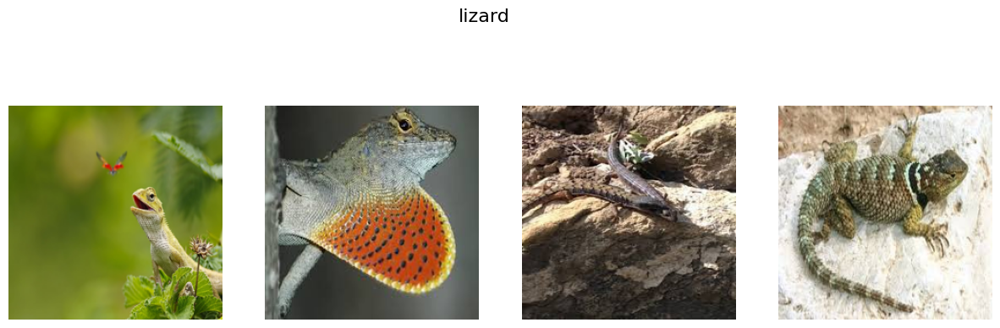

Image class: gorilla


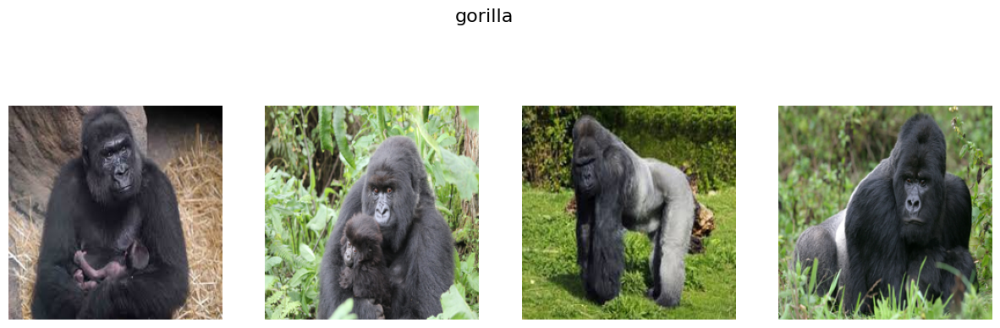

In [ ]:
for i in random.sample(range(0, len(class_names)), 3):
    view_a_random_images_class_resize(target_dir = "/content/animals/animals/", target_class = class_names[i])

## Create dataframe and split data to training and validation data

In [ ]:
from pathlib import Path
import os.path


def create_data_frame_from_image_path(PATH_DIR):
    image_dir = Path(PATH_DIR)
    filepaths = list(image_dir.glob(r'**/*.jpg'))

    labels = list(map(lambda x: os.path.split(
        os.path.split(x)[0])[1], filepaths))

    filepaths = pd.Series(filepaths, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')

    # Combine filepaths and labels into a DataFrame
    images = pd.concat([filepaths, labels], axis=1)

    # Shuffle the data and reset the index
    image_df = images.sample(frac=1.0, random_state=1).reset_index(drop=True)

    # Display the final DataFrame
    return image_df


def split_data_train_val(total_class, image_df, val_size=1/2):

    # Assuming 'image_df' contains all the data with 'Filepath' and 'Label' columns
    train_df, val_df = train_test_split(
        image_df, test_size=val_size, random_state=1, stratify=image_df['Label'])

    # Print the number of samples in each set
    print(f"Training set: {len(train_df)} samples")
    print(f"Validation set: {len(val_df)} samples")

    print(f"Each class training set: {len(train_df)/total_class} samples")
    print(f"Each class validation set: {len(val_df)/total_class} samples")

    plot_data = np.array([len(train_df), len(val_df)])

    plot_labels = ["training", "validation"]

    plt.pie(plot_data, labels=plot_labels, autopct='%1.1f%%')
    plt.title('Percentage of training, validation data')

    return train_df, val_df

In [ ]:
image_df = create_data_frame_from_image_path("/content/animals/animals/")
image_df

,Filepath,Label
0,/content/animals/animals/duck/4d42d55198.jpg,duck
1,/content/animals/animals/boar/1e28d918cf.jpg,boar
2,/content/animals/animals/fly/813b861e76.jpg,fly
3,/content/animals/animals/hare/41ad954858.jpg,hare
4,/content/animals/animals/turtle/91fee2727d.jpg,turtle
...,...,...
5395,/content/animals/animals/boar/481db3c9bd.jpg,boar
5396,/content/animals/animals/bear/4ab1a3197a.jpg,bear
5397,/content/animals/animals/orangutan/83bfd54148.jpg,orangutan
5398,/content/animals/animals/hare/39e806591d.jpg,hare


In [ ]:
image_df["Label"].value_counts()

,count
Label,
duck,60
lion,60
elephant,60
sparrow,60
seahorse,60
...,...
hippopotamus,60
butterfly,60
deer,60


### Split data to training and validation data

Training set: 4050 samples
Validation set: 1350 samples
Each class training set: 45.0 samples
Each class validation set: 15.0 samples


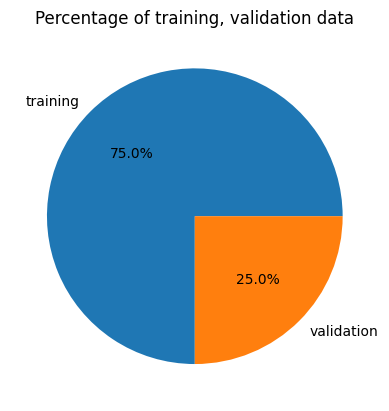

In [ ]:
train_df, val_df = split_data_train_val(len(class_names), image_df, val_size = 1/4)

In [ ]:
train_df

,Filepath,Label
478,/content/animals/animals/hippopotamus/8db6ef3b...,hippopotamus
1642,/content/animals/animals/boar/517c9f6d24.jpg,boar
4197,/content/animals/animals/starfish/006e7b1af6.jpg,starfish
2641,/content/animals/animals/bee/5267f18ec9.jpg,bee
3393,/content/animals/animals/turtle/32131cd126.jpg,turtle
...,...,...
4636,/content/animals/animals/jellyfish/6e71da9494.jpg,jellyfish
3382,/content/animals/animals/mouse/550be8df94.jpg,mouse
5308,/content/animals/animals/pelecaniformes/30c2d5...,pelecaniformes
4567,/content/animals/animals/kangaroo/6da87a2928.jpg,kangaroo


In [ ]:
val_df

,Filepath,Label
4935,/content/animals/animals/lion/49e03e97bf.jpg,lion
1491,/content/animals/animals/turtle/5e99e35659.jpg,turtle
977,/content/animals/animals/mosquito/49a8a6369a.jpg,mosquito
4918,/content/animals/animals/turkey/0acdbca850.jpg,turkey
2855,/content/animals/animals/caterpillar/73d9b459c...,caterpillar
...,...,...
3333,/content/animals/animals/oyster/f9e0569bde.jpg,oyster
2256,/content/animals/animals/deer/9d36044157.jpg,deer
5031,/content/animals/animals/boar/1643dbb824.jpg,boar
923,/content/animals/animals/seal/7dcdedd38f.jpg,seal


## Create data generator

In [ ]:
BATCH_SIZE = 30

* This will be used for training and validation

In [ ]:
def generate_training_data_from_dataframe(train_df, val_df, batch_size=32, img_height=224, img_width=224):

    # Define the data generators
    train_datagen = ImageDataGenerator(rescale=1./255)

    # Only rescale for validation and test data
    val_test_datagen = ImageDataGenerator(rescale=1./255)

    # Create the generators for training, validation, and test sets
    train_generator = train_datagen.flow_from_dataframe(
        # This assumes you split the data into 'train_df', 'val_df', etc.
        train_df,
        x_col='Filepath',
        y_col='Label',
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True,
    )

    val_generator = val_test_datagen.flow_from_dataframe(
        val_df,
        x_col='Filepath',
        y_col='Label',
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False,
    )

    return train_generator, val_generator

* Create train and validation generator

In [ ]:
train_generator, val_generator = generate_training_data_from_dataframe(train_df, val_df, batch_size = BATCH_SIZE)

Found 4050 validated image filenames belonging to 90 classes.
Found 1350 validated image filenames belonging to 90 classes.


# Create and train the models

## Neural Networks model

## Convolutional neural network model

## Transfer learning

### Resnet v50

In [ ]:
tf.keras.applications.ResNet50V2(
    include_top=True,
    weights = 'imagenet',
    input_tensor=None,
    input_shape=(None),
    pooling=None,
    classes=1000,
    classifier_activation='softmax'
).summary()

Model: "resnet50v2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14            │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_14[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_conv[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_bn    │ (None, 56, 56, 64)     │            256 │ pool1_pool[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_relu  │ (None, 56, 56, 64)     │              0 │ conv2_block1_preact_b… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,096 │ conv2_block1_preact_r… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_pad        │ (None, 58, 58, 64)     │              0 │ conv2_block1_1_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,864 │ conv2_block1_2_pad[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv  

 Total params: 25,613,800 (97.71 MB)

 Trainable params: 25,568,360 (97.54 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
from tensorflow.keras import regularizers
from tensorflow.keras.applications import ResNet50V2

# Instantiate the ResNet50V2 model with include_top=False
base_model = ResNet50V2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

# Build the model
model_ResNet_1 = tfk.Sequential([
    tfk.layers.Input(shape=(224, 224, 3)),
    tfk.layers.RandomFlip(mode="horizontal_and_vertical"),
    tfk.layers.RandomRotation(0.2),
    tfk.layers.RandomZoom(0.2),
    base_model,  # Add the ResNet model as a layer
    tfk.layers.GlobalAveragePooling2D(),  # Add pooling layer to reduce dimensionality
    tfk.layers.Dense(256, activation='relu',
                     kernel_regularizer=regularizers.l2(0.001)),
    tfk.layers.BatchNormalization(),
    tfk.layers.Dense(90, activation='softmax', name='OutputLayer')
])

# Compile the model
model_ResNet_1.compile(
    optimizer=tfk.optimizers.Adam(),
    loss=tfk.losses.CategoricalCrossentropy(),
    metrics=["accuracy", tfk.metrics.Recall(name="recall"), tfk.metrics.Precision(name="precision")],
)

# Display the model summary
model_ResNet_1.summary()


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_flip_5 (RandomFlip)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_5 (RandomRotation)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_5 (RandomZoom)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50v2 (Functional)              │ (None, 7, 7, 2048)          │      23,564,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_5           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 256)                 │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ OutputLayer (Dense)                  │ (None, 90)                  │          23,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,113,498 (91.99 MB)

 Trainable params: 548,186 (2.09 MB)

 Non-trainable params: 23,565,312 (89.89 MB)

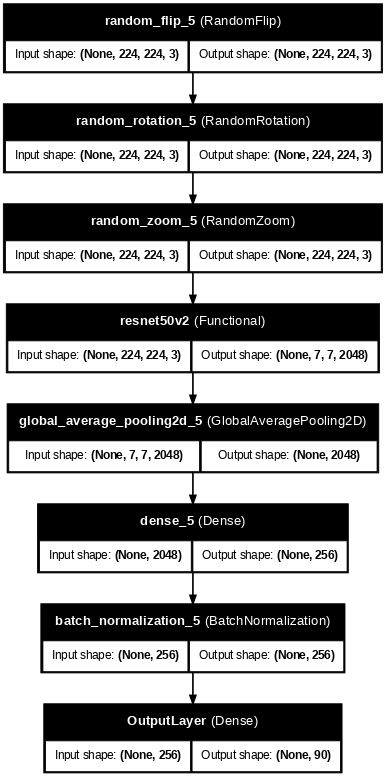

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model( model_ResNet_1, show_shapes=True, show_layer_names=True, dpi=60)

In [ ]:


# Define your batch size
batch_size = BATCH_SIZE  # Adjust this based on your available memory and dataset size

print("Training samples:", len(train_generator))
print("Validation samples:", len(val_generator))

# Define EarlyStopping callback
early_stopping = tfk.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=2,          # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True,  # Restores model weights from the epoch with the best monitored metric
)

    # Fit the model with additional logging
model_ResNet_1_history = model_ResNet_1.fit(train_generator,
                              validation_data=val_generator,
                              epochs=10,
                              steps_per_epoch= len(train_generator)+1,
                              validation_steps=len(val_generator)+1,
                              callbacks=[early_stopping],
                              verbose=1)

Training samples: 135
Validation samples: 45
Epoch 1/10
135/136 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.2804 - loss: 3.6897 - precision: 0.8013 - recall: 0.1246

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


136/136 ━━━━━━━━━━━━━━━━━━━━ 56s 344ms/step - accuracy: 0.2815 - loss: 3.6836 - precision: 0.8018 - recall: 0.1253 - val_accuracy: 0.7422 - val_loss: 1.3605 - val_precision: 0.8785 - val_recall: 0.6267
Epoch 2/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 69s 495ms/step - accuracy: 0.6673 - loss: 1.7023 - precision: 0.8994 - recall: 0.4565 - val_accuracy: 0.7867 - val_loss: 1.1662 - val_precision: 0.8873 - val_recall: 0.6822
Epoch 3/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 60s 332ms/step - accuracy: 0.7570 - loss: 1.3367 - precision: 0.9174 - recall: 0.5834 - val_accuracy: 0.8044 - val_loss: 1.0690 - val_precision: 0.8943 - val_recall: 0.7333
Epoch 4/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 74s 277ms/step - accuracy: 0.7871 - loss: 1.1460 - precision: 0.9215 - recall: 0.6594 - val_accuracy: 0.8133 - val_loss: 1.0042 - val_precision: 0.8981 - val_recall: 0.7444
Epoch 5/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 38s 269ms/step - accuracy: 0.8081 - loss: 1.0422 - precision: 0.9160 - recall: 0.7076 - val_accuracy: 0.7993 - val_loss

### VGG 16


In [ ]:
tf.keras.applications.VGG16(
    include_top=True,
    weights = 'imagenet',
    input_tensor=None,
    input_shape=(None),
    pooling=None,
    classes=1000,
    classifier_activation='softmax'
).summary()

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 4096)                │     102,764,544 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
from tensorflow.keras import regularizers
from tensorflow.keras.applications import VGG16

# Instantiate the VGG16 model with include_top=False
base_model_vgg = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model_vgg.trainable = False

# Build the model
model_VGG_16 = tfk.Sequential([
    tfk.layers.Input(shape=(224, 224, 3)),
    tfk.layers.RandomFlip(mode="horizontal_and_vertical"),
    tfk.layers.RandomRotation(0.2),
    tfk.layers.RandomZoom(0.2),
    base_model_vgg ,  # Add the ResNet model as a layer
    tfk.layers.GlobalAveragePooling2D(),  # Add pooling layer to reduce dimensionality
    tfk.layers.Dense(256, activation='relu',
                     kernel_regularizer=regularizers.l2(0.001)),
    tfk.layers.BatchNormalization(),
    tfk.layers.Dense(90, activation='softmax', name='OutputLayer')
])

# Compile the model
model_VGG_16.compile(
    optimizer=tfk.optimizers.Adam(),
    loss=tfk.losses.CategoricalCrossentropy(),
    metrics=["accuracy", tfk.metrics.Recall(name="recall"), tfk.metrics.Precision(name="precision")],
)

# Display the model summary
model_VGG_16.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_flip_4 (RandomFlip)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_4 (RandomRotation)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_4 (RandomZoom)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_4           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ OutputLayer (Dense)                  │ (None, 90)                  │          23,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,870,170 (56.73 MB)

 Trainable params: 154,970 (605.35 KB)

 Non-trainable params: 14,715,200 (56.13 MB)

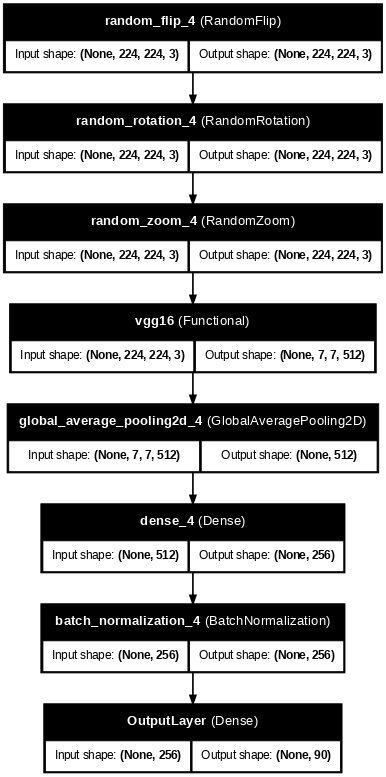

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model( model_VGG_16, show_shapes=True, show_layer_names=True, dpi=60)

In [ ]:


# Define your batch size
batch_size = BATCH_SIZE  # Adjust this based on your available memory and dataset size

print("Training samples:", len(train_generator))
print("Validation samples:", len(val_generator))

# Define EarlyStopping callback
early_stopping = tfk.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=2,          # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True,  # Restores model weights from the epoch with the best monitored metric
)

    # Fit the model with additional logging
model_VGG_16_history = model_VGG_16.fit(train_generator,
                              validation_data=val_generator,
                              epochs=10,
                              steps_per_epoch= len(train_generator)+1,
                              validation_steps=len(val_generator)+1,
                              callbacks=[early_stopping],
                              verbose=1)

Training samples: 135
Validation samples: 45
Epoch 1/10
135/136 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.0839 - loss: 4.5132 - precision: 0.4760 - recall: 0.0032

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


136/136 ━━━━━━━━━━━━━━━━━━━━ 48s 302ms/step - accuracy: 0.0843 - loss: 4.5101 - precision: 0.4791 - recall: 0.0032 - val_accuracy: 0.1948 - val_loss: 4.1498 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 40s 288ms/step - accuracy: 0.2985 - loss: 3.1869 - precision: 0.8265 - recall: 0.0481 - val_accuracy: 0.3126 - val_loss: 3.4025 - val_precision: 0.9333 - val_recall: 0.0104
Epoch 3/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 43s 306ms/step - accuracy: 0.3882 - loss: 2.7650 - precision: 0.8879 - recall: 0.1178 - val_accuracy: 0.3667 - val_loss: 2.9093 - val_precision: 0.8452 - val_recall: 0.1052
Epoch 4/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 40s 282ms/step - accuracy: 0.4720 - loss: 2.3988 - precision: 0.8889 - recall: 0.1885 - val_accuracy: 0.3896 - val_loss: 2.6810 - val_precision: 0.8098 - val_recall: 0.2081
Epoch 5/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 52s 373ms/step - accuracy: 0.4929 - loss: 2.2548 - precision: 0.8853 - recall: 0.2315 - val_accuracy: 0.3926 - 

### Inception V3

In [ ]:
tf.keras.applications.InceptionV3(
    include_top=True,
    weights = 'imagenet',
    input_tensor=None,
    input_shape=(None),
    pooling=None,
    classes=1000,
    classifier_activation='softmax'
).summary()

96112376/96112376 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_17            │ (None, 299, 299, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 149, 149, 32)   │            864 │ input_layer_17[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_6     │ (None, 149, 149, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 149, 149, 32)   │              0 │ batch_normalization_6… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 147, 147, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_7     │ (None, 147, 147, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 147, 147, 32)   │              0 │ batch_normalization_7… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 147, 147, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_8     │ (None, 147, 147, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 147, 147, 64)   │              0 │ batch_normalization_8… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_27          │ (None, 73, 73, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 73, 73, 80)     │          5,120 │ max_pooling2d_27[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_9     │ (None, 73, 73, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 73, 73, 80)     │              0 │ batch_normalization_9… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 71, 71, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_10    │ (None, 71, 71, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 23,851,784 (90.99 MB)

 Trainable params: 23,817,352 (90.86 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
from tensorflow.keras import regularizers
from tensorflow.keras.applications import InceptionV3

# Instantiate the InceptionV3 model with include_top=False
base_model_i_v3 = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model_i_v3.trainable = False

# Build the model
model_i_v3 = tfk.Sequential([
    tfk.layers.Input(shape=(224, 224, 3)),
    tfk.layers.RandomFlip(mode="horizontal_and_vertical"),
    tfk.layers.RandomRotation(0.2),
    tfk.layers.RandomZoom(0.2),
    base_model_i_v3,  # Add the ResNet model as a layer
    tfk.layers.GlobalAveragePooling2D(),  # Add pooling layer to reduce dimensionality
    tfk.layers.Dense(256, activation='relu',
                     kernel_regularizer=regularizers.l2(0.001)),
    tfk.layers.BatchNormalization(),
    tfk.layers.Dense(90, activation='softmax', name='OutputLayer')
])

# Compile the model
model_i_v3.compile(
    optimizer=tfk.optimizers.Adam(),
    loss=tfk.losses.CategoricalCrossentropy(),
    metrics=["accuracy", tfk.metrics.Recall(name="recall"), tfk.metrics.Precision(name="precision")],
)

# Display the model summary
model_i_v3.summary()


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_flip_6 (RandomFlip)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_6 (RandomRotation)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_6 (RandomZoom)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ inception_v3 (Functional)            │ (None, 5, 5, 2048)          │      21,802,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_6           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 256)                 │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_194              │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ OutputLayer (Dense)                  │ (None, 90)                  │          23,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,351,482 (85.26 MB)

 Trainable params: 548,186 (2.09 MB)

 Non-trainable params: 21,803,296 (83.17 MB)

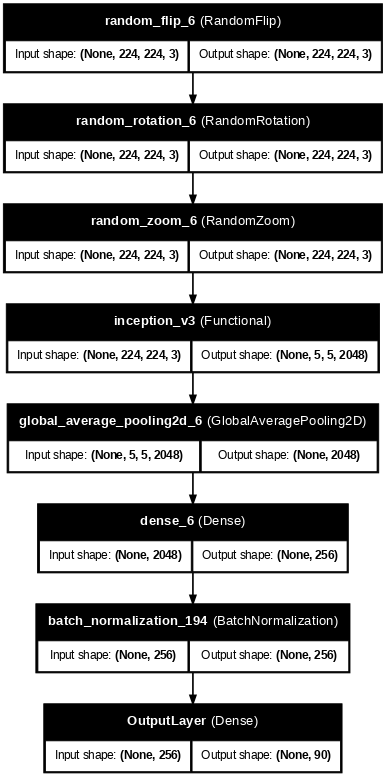

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model_i_v3, show_shapes=True, show_layer_names=True, dpi=60)

In [ ]:

# Define your batch size
batch_size = BATCH_SIZE  # Adjust this based on your available memory and dataset size

print("Training samples:", len(train_generator))
print("Validation samples:", len(val_generator))

# Define EarlyStopping callback
early_stopping = tfk.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=2,          # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True,  # Restores model weights from the epoch with the best monitored metric
)

    # Fit the model with additional logging
model_i_v3_history = model_i_v3.fit(train_generator,
                              validation_data=val_generator,
                              epochs=10,
                              steps_per_epoch= len(train_generator)+1,
                              validation_steps=len(val_generator)+1,
                              callbacks=[early_stopping],
                              verbose=1)

Training samples: 135
Validation samples: 45
Epoch 1/10
135/136 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - accuracy: 0.3295 - loss: 3.5993 - precision: 0.8945 - recall: 0.1600

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


136/136 ━━━━━━━━━━━━━━━━━━━━ 58s 304ms/step - accuracy: 0.3306 - loss: 3.5935 - precision: 0.8945 - recall: 0.1609 - val_accuracy: 0.7296 - val_loss: 1.4808 - val_precision: 0.8705 - val_recall: 0.6222
Epoch 2/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - accuracy: 0.6626 - loss: 1.7694 - precision: 0.8898 - recall: 0.4917 - val_accuracy: 0.7807 - val_loss: 1.2565 - val_precision: 0.8907 - val_recall: 0.7000
Epoch 3/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 38s 268ms/step - accuracy: 0.6972 - loss: 1.5449 - precision: 0.8889 - recall: 0.5419 - val_accuracy: 0.8052 - val_loss: 1.1172 - val_precision: 0.9124 - val_recall: 0.7326
Epoch 4/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 40s 263ms/step - accuracy: 0.7414 - loss: 1.3843 - precision: 0.9008 - recall: 0.5985 - val_accuracy: 0.8044 - val_loss: 1.1545 - val_precision: 0.8831 - val_recall: 0.7274
Epoch 5/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 43s 275ms/step - accuracy: 0.7657 - loss: 1.2533 - precision: 0.9093 - recall: 0.6464 - val_accuracy: 0.7756 - val_loss

### Resnet v101

In [ ]:
tf.keras.applications.ResNet101V2(
    include_top=True,
    weights = 'imagenet',
    input_tensor=None,
    input_shape=(None),
    pooling=None,
    classes=1000,
    classifier_activation='softmax'
).summary()


Model: "resnet101v2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_28            │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_28[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_conv[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_bn    │ (None, 56, 56, 64)     │            256 │ pool1_pool[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_relu  │ (None, 56, 56, 64)     │              0 │ conv2_block1_preact_b… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,096 │ conv2_block1_preact_r… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_pad        │ (None, 58, 58, 64)     │              0 │ conv2_block1_1_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,864 │ conv2_block1_2_pad[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv  

 Total params: 44,675,560 (170.42 MB)

 Trainable params: 44,577,896 (170.05 MB)

 Non-trainable params: 97,664 (381.50 KB)

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
from tensorflow.keras import regularizers
from tensorflow.keras.applications import ResNet101V2

# Instantiate the ResNet101V2 model with include_top=False
base_model_2 = ResNet101V2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model_2.trainable = False

# Build the model
model_ResNet_2 = tfk.Sequential([
    tfk.layers.Input(shape=(224, 224, 3)),
    tfk.layers.RandomFlip(mode="horizontal_and_vertical"),
    tfk.layers.RandomRotation(0.2),
    tfk.layers.RandomZoom(0.2),
    base_model_2,  # Add the ResNet model as a layer
    tfk.layers.GlobalAveragePooling2D(),  # Add pooling layer to reduce dimensionality
    tfk.layers.Dense(256, activation='relu',
                     kernel_regularizer=regularizers.l2(0.001)),
    tfk.layers.BatchNormalization(),
    tfk.layers.Dense(90, activation='softmax', name='OutputLayer')
])

# Compile the model
model_ResNet_2.compile(
    optimizer=tfk.optimizers.Adam(),
    loss=tfk.losses.CategoricalCrossentropy(),
    metrics=["accuracy", tfk.metrics.Recall(name="recall"), tfk.metrics.Precision(name="precision")],
)

# Display the model summary
model_ResNet_2.summary()


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_flip_10 (RandomFlip)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_10 (RandomRotation)  │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_10 (RandomZoom)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet101v2 (Functional)             │ (None, 7, 7, 2048)          │      42,626,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_10          │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 256)                 │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_198              │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ OutputLayer (Dense)                  │ (None, 90)                  │          23,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 43,175,258 (164.70 MB)

 Trainable params: 548,186 (2.09 MB)

 Non-trainable params: 42,627,072 (162.61 MB)

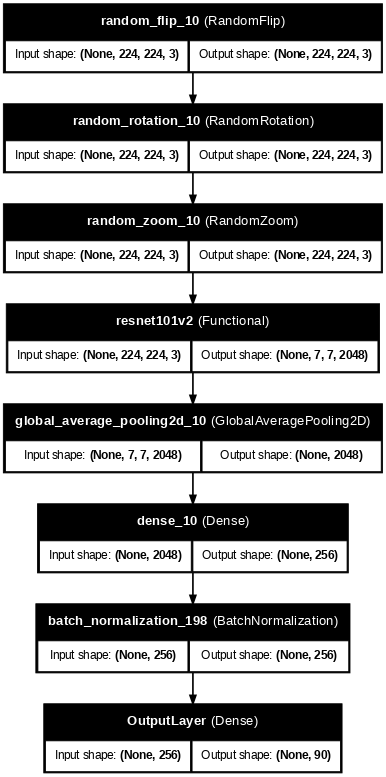

In [ ]:
plot_model(model_ResNet_2, show_shapes=True, show_layer_names=True, dpi=60)

In [ ]:
# Define your batch size
batch_size = BATCH_SIZE  # Adjust this based on your available memory and dataset size

print("Training samples:", len(train_generator))
print("Validation samples:", len(val_generator))

# Define EarlyStopping callback
early_stopping = tfk.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=2,          # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True,  # Restores model weights from the epoch with the best monitored metric
)

    # Fit the model with additional logging
model_ResNet_2_history = model_ResNet_2.fit(train_generator,
                              validation_data=val_generator,
                              epochs=10,
                              steps_per_epoch= len(train_generator)+1,
                              validation_steps=len(val_generator)+1,
                              callbacks=[early_stopping],
                              verbose=1)

Training samples: 135
Validation samples: 45
Epoch 1/10
135/136 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.3131 - loss: 3.6326 - precision: 0.7706 - recall: 0.1359

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


136/136 ━━━━━━━━━━━━━━━━━━━━ 71s 388ms/step - accuracy: 0.3142 - loss: 3.6261 - precision: 0.7714 - recall: 0.1369 - val_accuracy: 0.7881 - val_loss: 1.1944 - val_precision: 0.8990 - val_recall: 0.6859
Epoch 2/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 82s 386ms/step - accuracy: 0.6873 - loss: 1.6071 - precision: 0.9086 - recall: 0.5158 - val_accuracy: 0.8341 - val_loss: 1.0036 - val_precision: 0.9101 - val_recall: 0.7578
Epoch 3/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 43s 306ms/step - accuracy: 0.7768 - loss: 1.2301 - precision: 0.9238 - recall: 0.6345 - val_accuracy: 0.8422 - val_loss: 0.9491 - val_precision: 0.9075 - val_recall: 0.7778
Epoch 4/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 82s 307ms/step - accuracy: 0.8068 - loss: 1.0694 - precision: 0.9170 - recall: 0.6935 - val_accuracy: 0.8489 - val_loss: 0.9072 - val_precision: 0.9142 - val_recall: 0.7970
Epoch 5/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 43s 308ms/step - accuracy: 0.8147 - loss: 1.0128 - precision: 0.9154 - recall: 0.7194 - val_accuracy: 0.8437 - val_loss

# Evaluate the model

## All evaluate functions

In [ ]:
import matplotlib.pyplot as plt


def plot_full_metrics(history):

    # Extract the metrics from the history object
    history_dict = history.history

    # accuracy = history_dict['accuracy']
    # val_accuracy = history_dict['val_accuracy']

    # Convert to percentage
    accuracy = [a * 100 for a in history_dict['accuracy']]
    val_accuracy = [va * 100 for va in history_dict['val_accuracy']]

    loss = history_dict['loss']
    val_loss = history_dict['val_loss']
    recall = history_dict['recall']
    val_recall = history_dict['val_recall']
    precision = history_dict['precision']
    val_precision = history_dict['val_precision']

    # Define the range of epochs
    epochs = range(1, len(accuracy) + 1)

    # Plot Accuracy
    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.plot(epochs, accuracy, 'bo-', label='Training Accuracy')
    plt.plot(epochs, val_accuracy, 'ro-', label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Loss
    plt.subplot(2, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Recall
    plt.subplot(2, 2, 3)
    plt.plot(epochs, recall, 'bo-', label='Training Recall')
    plt.plot(epochs, val_recall, 'ro-', label='Validation Recall')
    plt.title('Training and Validation Recall')
    plt.xlabel('Epochs')
    plt.ylabel('Recall')
    plt.legend()

    # Plot Precision
    plt.subplot(2, 2, 4)
    plt.plot(epochs, precision, 'bo-', label='Training Precision')
    plt.plot(epochs, val_precision, 'ro-', label='Validation Precision')
    plt.title('Training and Validation Precision')
    plt.xlabel('Epochs')
    plt.ylabel('Precision')
    plt.legend()

    # Adjust layout and show the plots
    plt.tight_layout()
    plt.show()


def plot_simple_metrics(history):

    # Extract the metrics from the history object
    history_dict = history.history

    # accuracy = history_dict['accuracy']
    # val_accuracy = history_dict['val_accuracy']

    # Convert to percentage
    accuracy = [a * 100 for a in history_dict['accuracy']]
    val_accuracy = [va * 100 for va in history_dict['val_accuracy']]

    loss = history_dict['loss']
    val_loss = history_dict['val_loss']

    # Define the range of epochs
    epochs = range(1, len(accuracy) + 1)

    # Plot Accuracy
    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.plot(epochs, accuracy, 'bo-', label='Training Accuracy')
    plt.plot(epochs, val_accuracy, 'ro-', label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Loss
    plt.subplot(2, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Adjust layout and show the plots
    plt.tight_layout()
    plt.show()


In [ ]:
import seaborn as sn
import pandas as pd
import numpy as np
import tensorflow as tf
import seaborn as sn


# def create_confusion_table(model, validation_data, steps_per_epoch):

#     # Get the true labels from the validation dataset
#     true_labels = []
#     for images, labels in validation_data:
#         true_labels.extend(np.argmax(labels, axis=1))

#     # Make predictions on the validation dataset
#     predictions = model.predict(validation_data, steps=steps_per_epoch, verbose=1)
#     predicted_labels = np.argmax(predictions, axis=1)

#     # Create confusion matrix
#     confusion_matrix = pd.crosstab(
#         np.array(true_labels),
#         predicted_labels,
#         rownames=['Actual'],
#         colnames=['Predicted']
#     )

#     return confusion_matrix

def create_confusion_table(model, validation_data):
    # Get the total number of samples and input image shape
    num_samples = validation_data.samples  # Total number of samples
    input_shape = validation_data.image_shape  # Shape of a single input image

    # Get the number of classes from the generator's class_indices
    num_classes = len(validation_data.class_indices)  # Number of classes

    # Allocate arrays for all data (images and labels)
    all_images = np.zeros((num_samples,) + input_shape, dtype=np.float32)
    all_labels = np.zeros((num_samples, num_classes), dtype=np.float32)

    # Accumulate all images and labels
    current_index = 0  # Track current insertion point

    for batch_images, batch_labels in validation_data:
        batch_size = batch_images.shape[0]
        end_index = current_index + batch_size

        # Insert batch data into the allocated arrays
        all_images[current_index:end_index] = batch_images
        all_labels[current_index:end_index] = batch_labels

        current_index = end_index  # Move the pointer

        if end_index >= num_samples:  # Stop when all samples are processed
            break

    # Make predictions on the entire dataset at once
    predictions = model.predict(
        all_images, steps=len(validation_data), verbose=1)
    predicted_labels = np.argmax(predictions, axis=1)

    # Get the true labels from the accumulated labels
    true_labels = np.argmax(all_labels, axis=1)

    # Create confusion matrix using Pandas
    confusion_matrix = pd.crosstab(
        true_labels, predicted_labels, rownames=['Actual'], colnames=['Predicted']
    )

    return confusion_matrix


def create_confusion_table_with_class_names(model, validation_data):
    # Get the total number of samples and input image shape
    num_samples = validation_data.samples
    input_shape = validation_data.image_shape

    # Get the number of classes and class labels from class_indices
    class_indices = validation_data.class_indices
    # Map indices to class names
    class_labels = {v: k for k, v in class_indices.items()}

    num_classes = len(class_indices)

    # Allocate arrays for all data (images and labels)
    all_images = np.zeros((num_samples,) + input_shape, dtype=np.float32)
    all_labels = np.zeros((num_samples, num_classes), dtype=np.float32)

    # Accumulate all images and labels
    current_index = 0

    for batch_images, batch_labels in validation_data:
        batch_size = batch_images.shape[0]
        end_index = current_index + batch_size

        # Insert batch data into the allocated arrays
        all_images[current_index:end_index] = batch_images
        all_labels[current_index:end_index] = batch_labels

        current_index = end_index

        if end_index >= num_samples:
            break

    # Make predictions on the entire dataset at once
    predictions = model.predict(
        all_images, steps=len(validation_data), verbose=1)
    predicted_labels = np.argmax(predictions, axis=1)

    # Get the true labels from the accumulated labels
    true_labels = np.argmax(all_labels, axis=1)

    # Map the indices in true_labels and predicted_labels to class names
    true_class_names = [class_labels[label] for label in true_labels]
    predicted_class_names = [class_labels[label] for label in predicted_labels]

    # Create confusion matrix using Pandas with class names
    confusion_matrix = pd.crosstab(
        pd.Series(true_class_names, name='Actual'),
        pd.Series(predicted_class_names, name='Predicted')
    )

    return confusion_matrix


def plot_confusion_matrix(confusion_matrix):
    print("Heatmap\n")
    plt.figure(figsize=(30, 30))
    sn.heatmap(confusion_matrix, annot=True, cmap='Blues')
    plt.show()

In [ ]:
# Assuming `model` is your trained model and `validation_data` is a data generator
import numpy as np
from sklearn.metrics import classification_report


def classification_report_final(model, validation_data):
    # Get the total number of samples and input image shape
    num_samples = validation_data.samples  # Total number of samples
    input_shape = validation_data.image_shape  # Shape of a single input image

    # Get the number of classes from the generator's class_indices
    num_classes = len(validation_data.class_indices)  # Number of classes

    # Allocate arrays for all data (images and labels)
    all_images = np.zeros((num_samples,) + input_shape, dtype=np.float32)
    all_labels = np.zeros((num_samples, num_classes), dtype=np.float32)

    # Accumulate all images and labels
    current_index = 0  # Track current insertion point

    for batch_images, batch_labels in validation_data:
        batch_size = batch_images.shape[0]
        end_index = current_index + batch_size

        # Insert batch data into the allocated arrays
        all_images[current_index:end_index] = batch_images
        all_labels[current_index:end_index] = batch_labels

        current_index = end_index  # Move the pointer

        if end_index >= num_samples:  # Stop when all samples are processed
            break

    # Make predictions on the entire dataset at once
    predictions = model.predict(
        all_images, steps=len(validation_data), verbose=1)
    predicted_labels = np.argmax(predictions, axis=1)

    # Get the true labels from the accumulated labels
    true_labels = np.argmax(all_labels, axis=1)

    # Generate the classification report
    class_labels = list(validation_data.class_indices.keys()
                        )      # Get class names
    report = classification_report(
        true_labels, predicted_labels, target_names=class_labels)
    print(report)


## Model 1 - NN models

## Model 2 - Custom CNN model

## Model 3 - RESNET v50 model

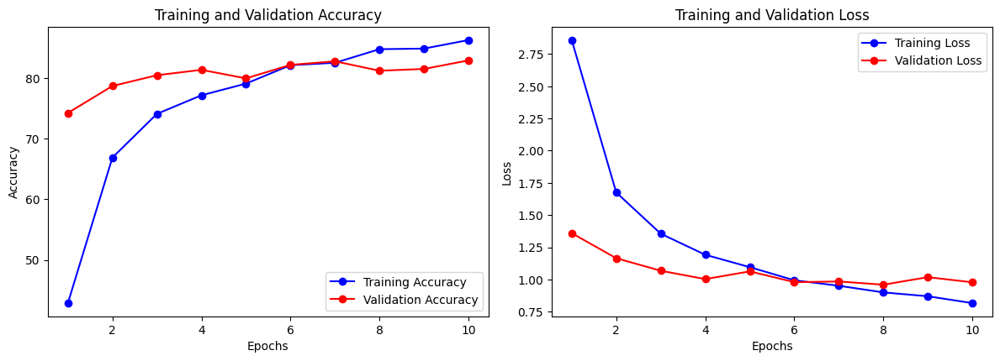

In [ ]:
plot_simple_metrics(model_ResNet_1_history)

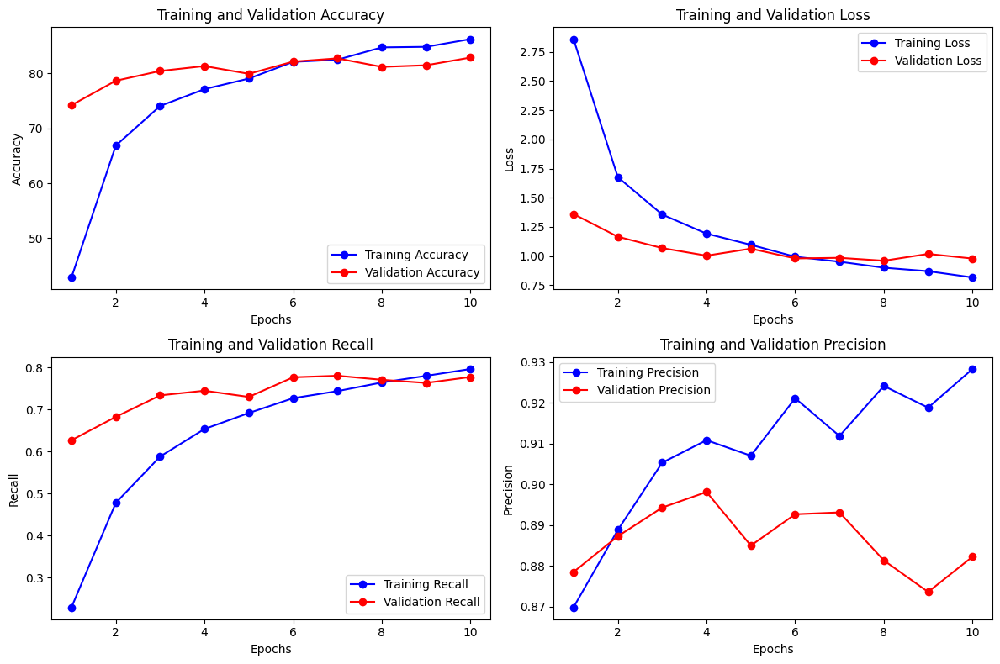

In [ ]:
plot_full_metrics(model_ResNet_1_history)

45/45 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step
Heatmap



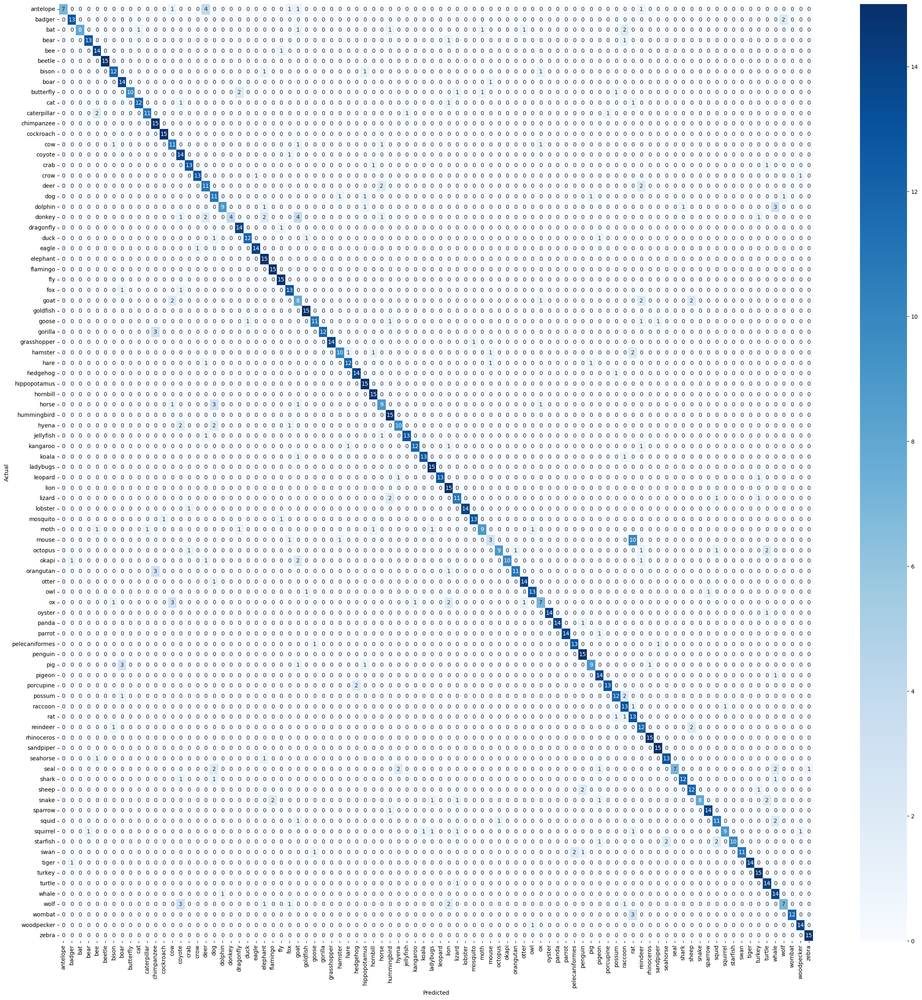

In [ ]:
confusion_matrix = create_confusion_table_with_class_names(model_ResNet_1, val_generator)
plot_confusion_matrix(confusion_matrix)

In [ ]:
classification_report_final(model_ResNet_1, val_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step
                precision    recall  f1-score   support

      antelope       1.00      0.47      0.64        15
        badger       0.87      0.87      0.87        15
           bat       1.00      0.53      0.70        15
          bear       0.93      0.87      0.90        15
           bee       0.78      0.93      0.85        15
        beetle       1.00      1.00      1.00        15
         bison       0.80      0.80      0.80        15
          boar       0.74      0.93      0.82        15
     butterfly       1.00      0.67      0.80        15
           cat       0.92      0.80      0.86        15
   caterpillar       0.92      0.73      0.81        15
    chimpanzee       0.71      1.00      0.83        15
     cockroach       0.94      1.00      0.97        15
           cow       0.61      0.73      0.67        15
        coyote       0.61      0.93      0.74        15
          crab       0.87      0.87      0.87        15
       

## Model 4 - VGG 16 model

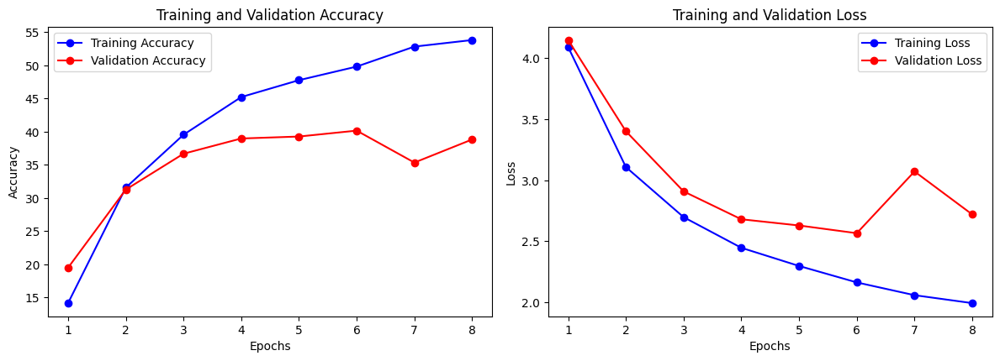

In [ ]:
plot_simple_metrics(model_VGG_16_history)

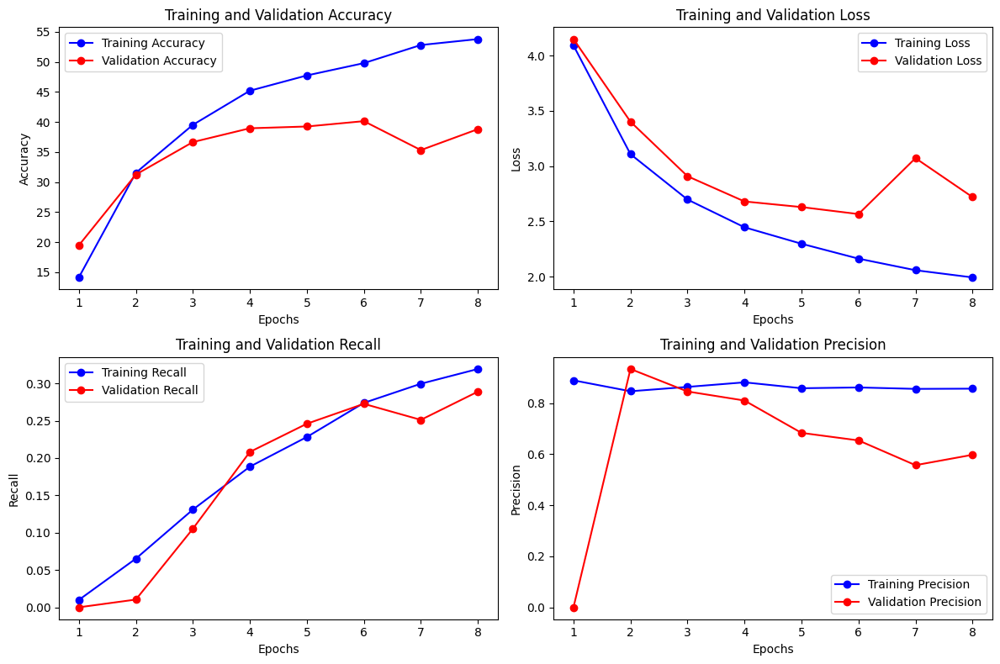

In [ ]:
plot_full_metrics(model_VGG_16_history)

45/45 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step
Heatmap



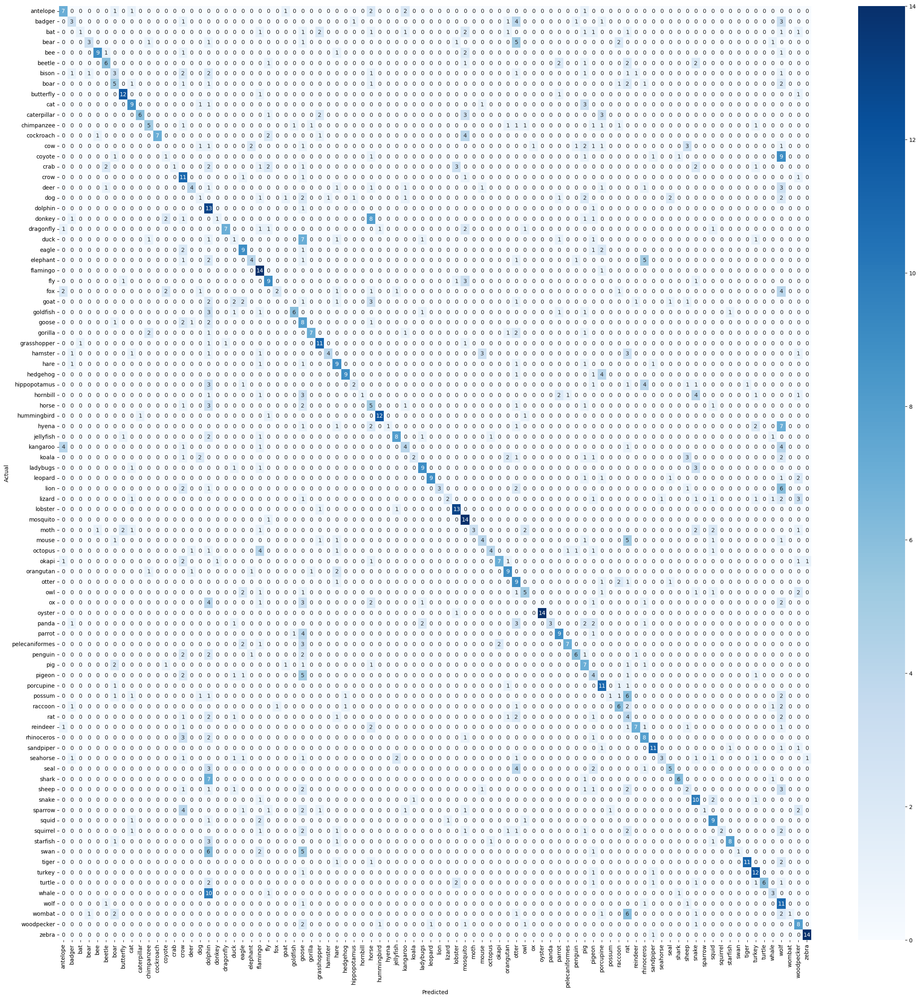

In [ ]:
confusion_matrix = create_confusion_table_with_class_names(model_VGG_16, val_generator)
plot_confusion_matrix(confusion_matrix)

In [ ]:
classification_report_final(model_VGG_16, val_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 6s 136ms/step
                precision    recall  f1-score   support

      antelope       0.44      0.47      0.45        15
        badger       0.30      0.20      0.24        15
           bat       0.50      0.07      0.12        15
          bear       0.60      0.20      0.30        15
           bee       0.82      0.60      0.69        15
        beetle       0.55      0.40      0.46        15
         bison       0.00      0.00      0.00        15
          boar       0.26      0.33      0.29        15
     butterfly       0.75      0.80      0.77        15
           cat       0.50      0.60      0.55        15
   caterpillar       0.86      0.40      0.55        15
    chimpanzee       0.50      0.33      0.40        15
     cockroach       1.00      0.47      0.64        15
           cow       0.00      0.00      0.00        15
        coyote       0.17      0.07      0.10        15
          crab       1.00      0.07      0.12        15
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model 5 - Inception V3

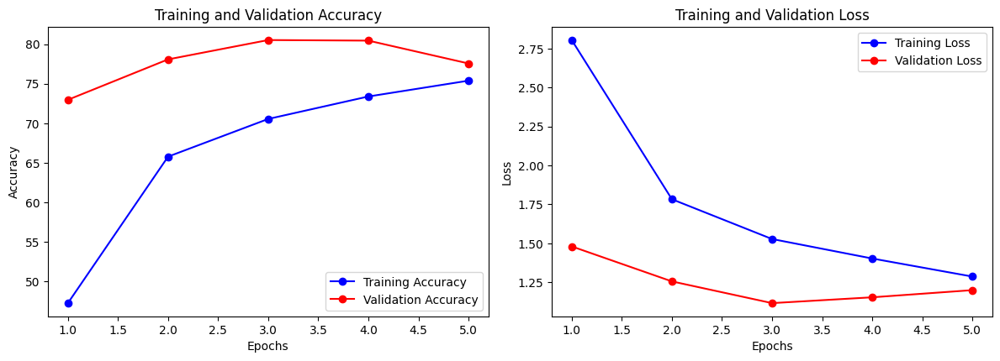

In [ ]:
plot_simple_metrics(model_i_v3_history)

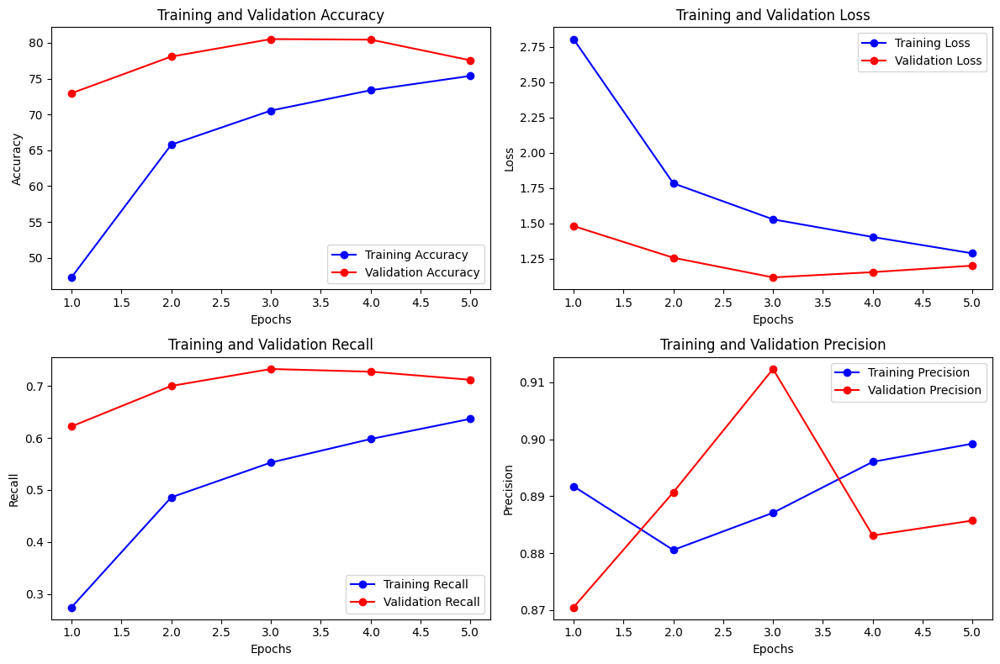

In [ ]:
plot_full_metrics(model_i_v3_history)

45/45 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step
Heatmap



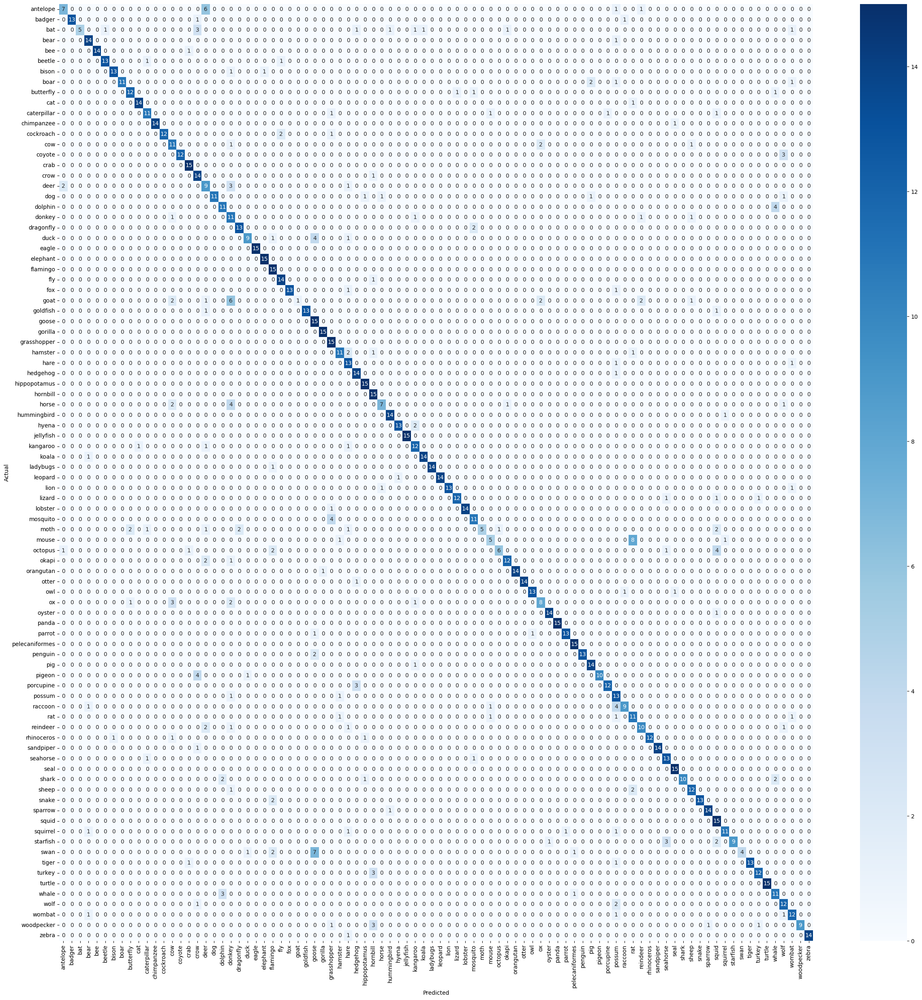

In [ ]:
confusion_matrix = create_confusion_table_with_class_names(model_i_v3, val_generator)
plot_confusion_matrix(confusion_matrix)

In [ ]:
classification_report_final(model_i_v3, val_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step
                precision    recall  f1-score   support

      antelope       0.70      0.47      0.56        15
        badger       1.00      0.87      0.93        15
           bat       1.00      0.33      0.50        15
          bear       0.78      0.93      0.85        15
           bee       1.00      0.93      0.97        15
        beetle       0.93      0.87      0.90        15
         bison       0.93      0.87      0.90        15
          boar       1.00      0.73      0.85        15
     butterfly       0.80      0.80      0.80        15
           cat       0.93      0.93      0.93        15
   caterpillar       0.79      0.73      0.76        15
    chimpanzee       1.00      0.93      0.97        15
     cockroach       1.00      0.80      0.89        15
           cow       0.55      0.73      0.63        15
        coyote       1.00      0.80      0.89        15
          crab       0.83      1.00      0.91        15
       

## Model 6 - Resnet v101

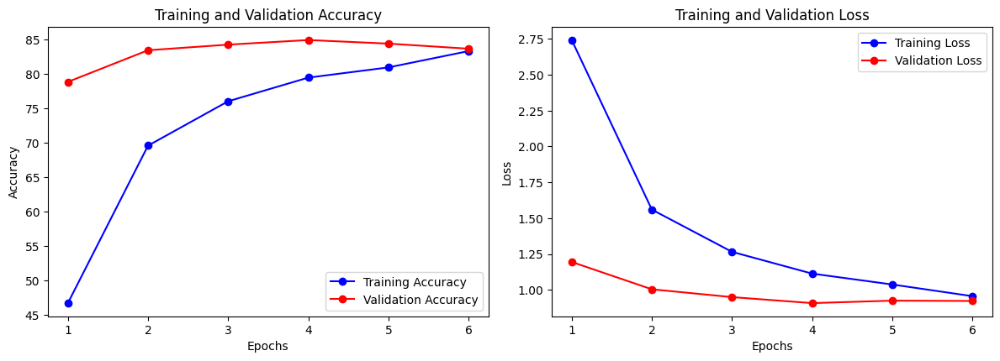

In [ ]:
plot_simple_metrics(model_ResNet_2_history)

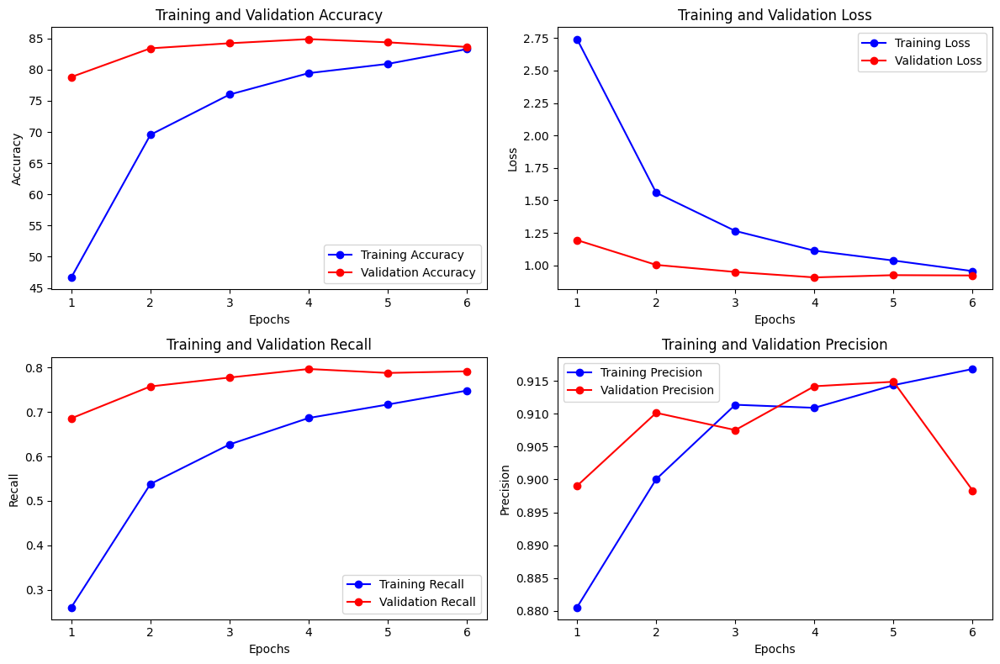

In [ ]:
plot_full_metrics(model_ResNet_2_history)

45/45 ━━━━━━━━━━━━━━━━━━━━ 11s 177ms/step
Heatmap



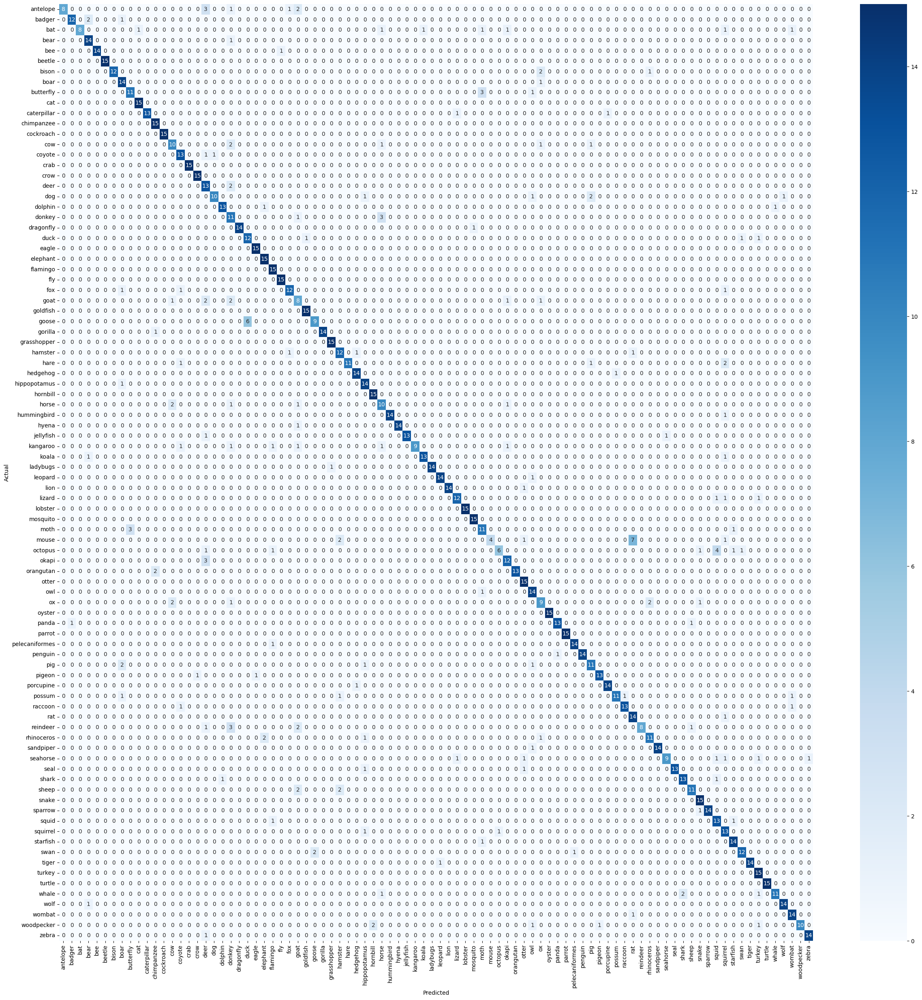

In [ ]:
confusion_matrix = create_confusion_table_with_class_names(model_ResNet_2, val_generator)
plot_confusion_matrix(confusion_matrix)

In [ ]:
classification_report_final(model_ResNet_2, val_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 8s 179ms/step
                precision    recall  f1-score   support

      antelope       1.00      0.53      0.70        15
        badger       0.92      0.80      0.86        15
           bat       1.00      0.53      0.70        15
          bear       0.78      0.93      0.85        15
           bee       1.00      0.93      0.97        15
        beetle       1.00      1.00      1.00        15
         bison       1.00      0.80      0.89        15
          boar       0.70      0.93      0.80        15
     butterfly       0.79      0.73      0.76        15
           cat       0.94      1.00      0.97        15
   caterpillar       1.00      0.87      0.93        15
    chimpanzee       0.83      1.00      0.91        15
     cockroach       1.00      1.00      1.00        15
           cow       0.67      0.67      0.67        15
        coyote       0.76      0.87      0.81        15
          crab       1.00      1.00      1.00        15
      

# Test our model

In [ ]:
import tensorflow as tf

def load_and_prep_image(filename, img_shape=224):
    """
    Reads an image from filename, turns it into a tensor,
    and reshapes it to (img_shape, img_shape, 3).
    """
    # Read in target file (an image)
    img = tf.io.read_file(filename)

    # Decode the image into a tensor and ensure it has 3 color channels
    img = tf.image.decode_image(img, channels=3)

    # Resize the image to (img_shape, img_shape)
    img = tf.image.resize(img, size=[img_shape, img_shape])

    # Rescale the image (get all values between 0 and 1)
    img = img / 255.0

    # Add a batch dimension
    img = tf.expand_dims(img, axis=0)
    return img

def predict_and_plot(model, filename, class_names):
    """
    Imports an image located at filename, makes a prediction on it with
    a trained model, and plots the image with the predicted class as the title.
    """
    # Import and preprocess the image
    img = load_and_prep_image(filename)

    # Make a prediction
    pred = model.predict(img)

    # Get the index of the class with the highest probability
    pred_class_idx = tf.argmax(pred, axis=1).numpy()[0]

    # Get the predicted class name
    pred_class = class_names[pred_class_idx]

    # Plot the image and predicted class
    img_to_plot = mpimg.imread(filename)  # Load the image for displaying in matplotlib
    plt.imshow(img_to_plot)
    plt.title(f"Prediction: {pred_class}")
    plt.axis(False)
    plt.show()


In [ ]:
!wget https://upload.wikimedia.org/wikipedia/commons/b/b9/%E3%83%AF%E3%82%AD%E3%83%B320120701.JPG

--2024-10-27 15:42:43--  https://upload.wikimedia.org/wikipedia/commons/b/b9/%E3%83%AF%E3%82%AD%E3%83%B320120701.JPG
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.153.240, 2620:0:860:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.153.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1378848 (1.3M) [image/jpeg]
Saving to: ‘ワキン20120701.JPG.1’

ワキン20120701.JPG. 100%[===================>]   1.31M  5.14MB/s    in 0.3s    

2024-10-27 15:42:43 (5.14 MB/s) - ‘ワキン20120701.JPG.1’ saved [1378848/1378848]



(-0.5, 2815.5, 2111.5, -0.5)

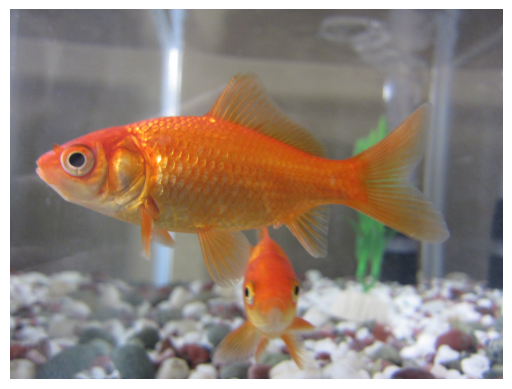

In [ ]:
img = mpimg.imread("ワキン20120701.JPG")
plt.imshow(img)
plt.axis(False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


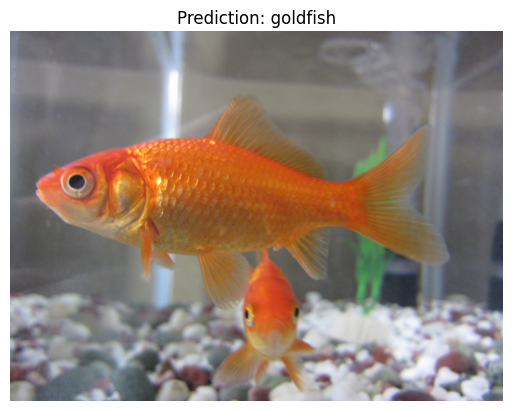

In [ ]:
predict_and_plot(model_ResNet_2, "ワキン20120701.JPG", class_names)

In [ ]:
!wget https://upload.wikimedia.org/wikipedia/commons/8/8d/American_bison_k5680-1.jpg

--2024-10-27 15:43:17--  https://upload.wikimedia.org/wikipedia/commons/8/8d/American_bison_k5680-1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.153.240, 2620:0:860:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.153.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1381140 (1.3M) [image/jpeg]
Saving to: ‘American_bison_k5680-1.jpg.1’

American_bison_k568 100%[===================>]   1.32M  5.09MB/s    in 0.3s    

2024-10-27 15:43:18 (5.09 MB/s) - ‘American_bison_k5680-1.jpg.1’ saved [1381140/1381140]



(-0.5, 2699.5, 1760.5, -0.5)

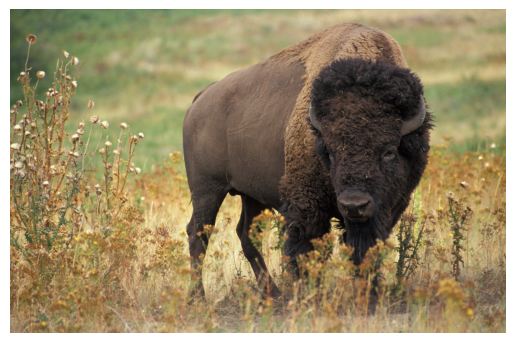

In [ ]:
img = mpimg.imread("American_bison_k5680-1.jpg.1")
plt.imshow(img)
plt.axis(False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


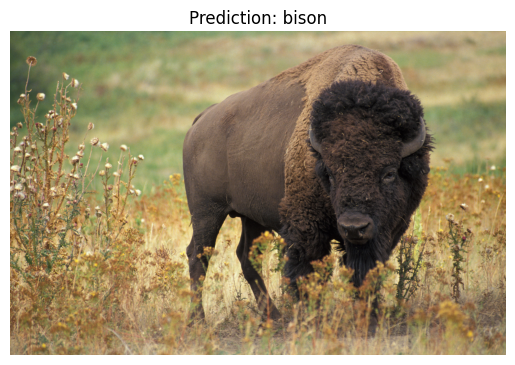

In [ ]:
predict_and_plot(model_ResNet_2, "American_bison_k5680-1.jpg.1", class_names)

In [ ]:
!wget https://cdn.britannica.com/79/232779-050-6B0411D7/German-Shepherd-dog-Alsatian.jpg

--2024-10-27 15:45:21--  https://cdn.britannica.com/79/232779-050-6B0411D7/German-Shepherd-dog-Alsatian.jpg
Resolving cdn.britannica.com (cdn.britannica.com)... 3.167.99.105, 3.167.99.97, 3.167.99.77, ...
Connecting to cdn.britannica.com (cdn.britannica.com)|3.167.99.105|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 344524 (336K) [image/jpeg]
Saving to: ‘German-Shepherd-dog-Alsatian.jpg’

German-Shepherd-dog 100%[===================>] 336.45K  --.-KB/s    in 0.06s   

2024-10-27 15:45:21 (5.83 MB/s) - ‘German-Shepherd-dog-Alsatian.jpg’ saved [344524/344524]



(-0.5, 1599.5, 1143.5, -0.5)

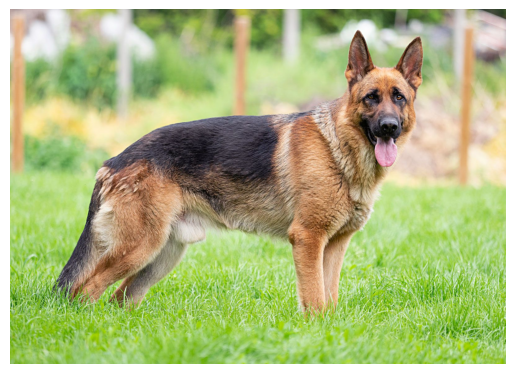

In [ ]:
img = mpimg.imread("German-Shepherd-dog-Alsatian.jpg")
plt.imshow(img)
plt.axis(False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


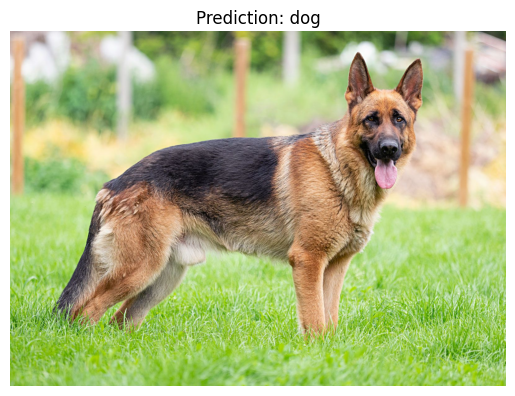

In [ ]:
predict_and_plot(model_ResNet_2, "German-Shepherd-dog-Alsatian.jpg", class_names)

In [ ]:
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/1/15/Cat_August_2010-4.jpg/1200px-Cat_August_2010-4.jpg

--2024-10-27 15:46:24--  https://upload.wikimedia.org/wikipedia/commons/thumb/1/15/Cat_August_2010-4.jpg/1200px-Cat_August_2010-4.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.153.240, 2620:0:860:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.153.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 139221 (136K) [image/jpeg]
Saving to: ‘1200px-Cat_August_2010-4.jpg’

1200px-Cat_August_2 100%[===================>] 135.96K  --.-KB/s    in 0.1s    

2024-10-27 15:46:25 (1.08 MB/s) - ‘1200px-Cat_August_2010-4.jpg’ saved [139221/139221]



(-0.5, 1199.5, 733.5, -0.5)

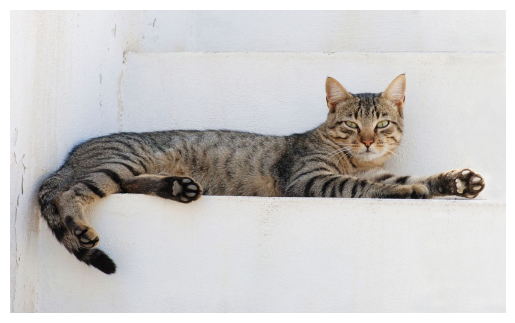

In [ ]:
img = mpimg.imread("1200px-Cat_August_2010-4.jpg")
plt.imshow(img)
plt.axis(False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


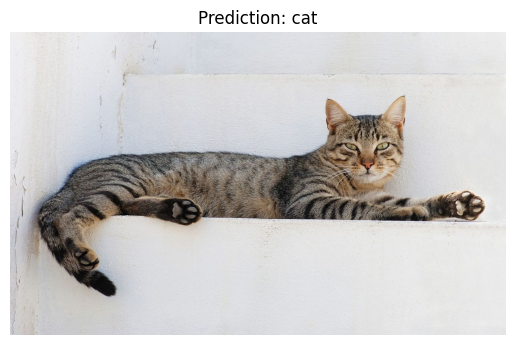

In [ ]:
predict_and_plot(model_ResNet_2, "1200px-Cat_August_2010-4.jpg", class_names)

In [ ]:
!wget https://ichef.bbci.co.uk/ace/standard/3840/cpsprodpb/456e/live/08bb1170-3f6c-11ef-abf4-9dcdb3140a6f.jpg

--2024-10-27 15:47:22--  https://ichef.bbci.co.uk/ace/standard/3840/cpsprodpb/456e/live/08bb1170-3f6c-11ef-abf4-9dcdb3140a6f.jpg
Resolving ichef.bbci.co.uk (ichef.bbci.co.uk)... 23.220.188.130, 2600:1402:16:58e::f33, 2600:1402:16:593::f33, ...
Connecting to ichef.bbci.co.uk (ichef.bbci.co.uk)|23.220.188.130|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 585129 (571K) [image/jpeg]
Saving to: ‘08bb1170-3f6c-11ef-abf4-9dcdb3140a6f.jpg’

08bb1170-3f6c-11ef- 100%[===================>] 571.42K  --.-KB/s    in 0.08s   

2024-10-27 15:47:22 (7.41 MB/s) - ‘08bb1170-3f6c-11ef-abf4-9dcdb3140a6f.jpg’ saved [585129/585129]



(-0.5, 3839.5, 2158.5, -0.5)

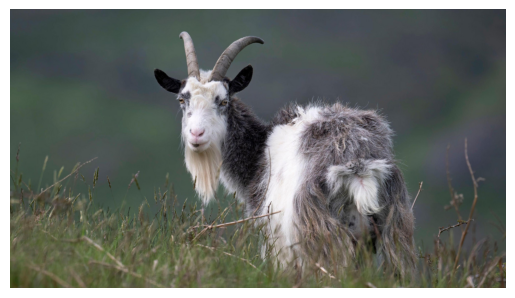

In [ ]:
img = mpimg.imread("08bb1170-3f6c-11ef-abf4-9dcdb3140a6f.jpg")
plt.imshow(img)
plt.axis(False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


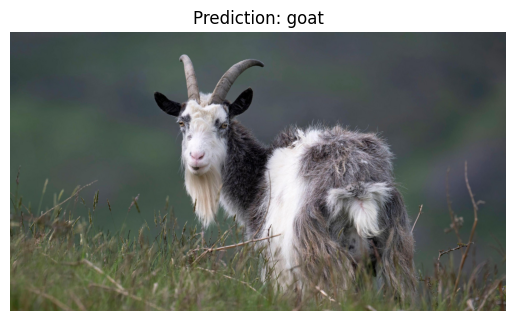

In [ ]:
predict_and_plot(model_ResNet_2, "08bb1170-3f6c-11ef-abf4-9dcdb3140a6f.jpg", class_names)